In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

<h1>Reading datasets</h1>

In [2]:
people_killed_dataset = pd.read_csv(r'datasets/Road_Accidents_2017-Annuxure_Tables_3.csv')
people_injured_dataset = pd.read_csv(r'datasets/Road_Accidents_2017-Annuxure_Tables_4.csv')
weather_accident_dataset = pd.read_csv(r'datasets/Acc_Classified_according_to_Type_of_Weather_Condition_2014_and_2016.csv')
roadcon_accident_dataset = pd.read_csv(r'datasets/Acc_clf_acco_to_Road_Cond_2014_and_2016.csv')
state_month_year_dataset = pd.read_csv(r'datasets/only_road_accidents_data_month2.csv')
state_hour_year_dataset = pd.read_csv(r'datasets/only_road_accidents_data3.csv')

<h1>Cleaning data</h1>

In [3]:
people_killed_dataset = people_killed_dataset.drop(
    columns=[
        'Share of States/UTs in Total Number of Persons Killed in Road Accidents - 2014',
        'Share of States/UTs in Total Number of Persons Killed in Road Accidents - 2015',
        'Share of States/UTs in Total Number of Persons Killed in Road Accidents - 2016',
        'Share of States/UTs in Total Number of Persons Killed in Road Accidents - 2017',
        'Total Number of Persons Killed in Road Accidents Per Lakh Population - 2014',
        'Total Number of Persons Killed in Road Accidents Per Lakh Population - 2015',
        'Total Number of Persons Killed in Road Accidents Per Lakh Population - 2016',
        'Total Number of Persons Killed in Road Accidents Per Lakh Population - 2017',
        'Total Number of Persons Killed in Road Accidents per 10,000 Vehicles - 2014',
        'Total Number of Persons Killed in Road Accidents per 10,000 Vehicles - 2015',
        'Total Number of Persons Killed in Road Accidents per 10,000 Vehicles - 2016',
        'Total Number of Persons Killed in Road Accidents per 10,000 Km of Roads - 2014',
        'Total Number of Persons Killed in Road Accidents per 10,000 Km of Roads - 2015',
        'Total Number of Persons Killed in Road Accidents per 10,000 Km of Roads - 2016'
    ])

In [4]:
people_injured_dataset = people_injured_dataset.drop(
    columns=[
        'Share of States/UTs in Total Number of Persons Injured in Road Accidents - 2014',
        'Share of States/UTs in Total Number of Persons Injured in Road Accidents - 2015',
        'Share of States/UTs in Total Number of Persons Injured in Road Accidents - 2016',
        'Share of States/UTs in Total Number of Persons Injured in Road Accidents - 2017',
        'Total Number of Persons Injured in Road Accidents Per Lakh Population - 2014',
        'Total Number of Persons Injured in Road Accidents Per Lakh Population - 2015',
        'Total Number of Persons Injured in Road Accidents Per Lakh Population - 2016',
        'Total Number of Persons Injured in Road Accidents Per Lakh Population - 2017',
        'Total Number of Persons injured in Road Accidents per 10,000 Vehicles - 2014',
        'Total Number of Persons injured in Road Accidents per 10,000 Vehicles - 2015',
        'Total Number of Persons injured in Road Accidents per 10,000 Vehicles - 2016',
        'Total Number of Persons injured in Road Accidents per 10,000 Km of Roads - 2014',
        'Total Number of Persons injured in Road Accidents per 10,000 Km of Roads - 2015',
        'Total Number of Persons injured in Road Accidents per 10,000 Km of Roads - 2016'
    ])

In [5]:
people_killed_dataset = people_killed_dataset.rename(
    columns={
        'State/UT-wise Total Number of Persons Killed in Road Accidents during - 2014':2014,
        'State/UT-wise Total Number of Persons Killed in Road Accidents during - 2015':2015,
        'State/UT-wise Total Number of Persons Killed in Road Accidents during - 2016':2016,
        'State/UT-wise Total Number of Persons Killed in Road Accidents during - 2017':2017
    })

In [6]:
people_injured_dataset = people_injured_dataset.rename(
    columns={
        'State/UT-wise Total Number of Persons Injured in Road Accidents during - 2014':2014,
        'State/UT-wise Total Number of Persons Injured in Road Accidents during - 2015':2015,
        'State/UT-wise Total Number of Persons Injured in Road Accidents during - 2016':2016,
        'State/UT-wise Total Number of Persons Injured in Road Accidents during - 2017':2017
    })

In [7]:
state_month_year_dataset['STATE/UT'] = state_month_year_dataset['STATE/UT'].replace({
    'Delhi (Ut)':'Delhi Ut',
    'D & N Haveli': 'D&N Haveli'
})

In [8]:
state_hour_year_dataset['STATE/UT'] = state_hour_year_dataset['STATE/UT'].replace({
    'Delhi (Ut)':'Delhi Ut',
    'D & N Haveli': 'D&N Haveli'
})

<h1>Defining Zones On the Basis of States</h1>

In [9]:
northern_zone = [
    'Jammu & Kashmir', 
    'Punjab', 
    'Himachal Pradesh',
    'Haryana', 
    'Uttarakhand', 
    'Uttar Pradesh', 
    'Chandigarh', 
    'Jammu and Kashmir',
    'Delhi'
]

In [10]:
eastern_zone = [
    'Bihar',
    'Odisha',
    'Jharkhand',
    'West Bengal', 
    'Orissa'
]

In [11]:
western_zone = [
    'Rajasthan', 
    'Gujarat', 
    'Goa',
    'Maharashtra'
]

In [12]:
southern_zone = [
    'Andhra Pradesh',
    'Karnataka',
    'Kerala',
    'Tamil Nadu',
    'Telangana'
]

In [13]:
central_zone = [
    'Madhya Pradesh',
    'Chhattisgarh'
]

In [14]:
northeastern_zone = [
    'Assam',
    'Sikkim',
    'Nagaland',
    'Meghalaya',
    'Manipur',
    'Mizoram',
    'Tripura',
    'Arunachal Pradesh'
]

In [15]:
union_territories = [
    'Andaman and Nicobar Islands',
    'Dadra and Nagar Haveli',
    'Puducherry',
    'Andaman & Nicobar Islands',
    'Dadra & Nagar Haveli',
    'Daman & Diu',
    'Lakshadweep',
    'A & N Islands',
    'D & N Haveli'
]

In [16]:
def defining_zones(row_values):
    if row_values['States/UTs'].strip() in northern_zone:
        return 'Northern Zone'
    if row_values['States/UTs'].strip() in eastern_zone:
        return 'Eastern Zone'
    if row_values['States/UTs'].strip() in western_zone:
        return 'Western Zone'
    if row_values['States/UTs'].strip() in northeastern_zone:
        return 'North Eastern Zone'
    if row_values['States/UTs'].strip() in central_zone:
        return 'Central Zone'
    if row_values['States/UTs'].strip() in union_territories:
        return 'Union Territory'
    if row_values['States/UTs'].strip() in southern_zone:
        return 'Southern Zone'
    return 'Other Zone'

def defining_zones_dif(row_values):
    if row_values['State/ UT'].strip() in northern_zone:
        return 'Northern Zone'
    if row_values['State/ UT'].strip() in eastern_zone:
        return 'Eastern Zone'
    if row_values['State/ UT'].strip() in western_zone:
        return 'Western Zone'
    if row_values['State/ UT'].strip() in northeastern_zone:
        return 'North Eastern Zone'
    if row_values['State/ UT'].strip() in central_zone:
        return 'Central Zone'
    if row_values['State/ UT'].strip() in union_territories:
        return 'Union Territory'
    if row_values['State/ UT'].strip() in southern_zone:
        return 'Southern Zone'
    return 'Other Zone'

In [17]:
# Dropping Total Row of People Killed Dataset
people_killed_dataset.drop(people_killed_dataset[people_killed_dataset['States/UTs'] == 'Total'].index, inplace=True)

In [18]:
# Dropping Total Row of People Injured Dataset
people_injured_dataset.drop(people_injured_dataset[people_injured_dataset['States/UTs'] == 'Total'].index, inplace=True)

In [19]:
# Dropping Total Row of Weather Dataset
weather_accident_dataset.drop(weather_accident_dataset[weather_accident_dataset['State/ UT'] == 'Total'].index, inplace=True)

In [20]:
#Dropping Total Row of Road Condition Dataset
roadcon_accident_dataset.drop(roadcon_accident_dataset[roadcon_accident_dataset['State/ UT'] == 'Total'].index, inplace=True)

In [21]:
# Applying Zone Names to States
people_killed_dataset['Zones'] = people_killed_dataset.apply(defining_zones, axis=1)
people_injured_dataset['Zones'] = people_killed_dataset.apply(defining_zones, axis=1)

In [22]:
weather_accident_dataset = weather_accident_dataset.drop(columns=['S. No.'])
roadcon_accident_dataset = roadcon_accident_dataset.drop(columns=['S. No.'])

In [23]:
weather_accident_dataset['Zones'] = weather_accident_dataset.apply(defining_zones_dif, axis=1)
roadcon_accident_dataset['Zones'] = roadcon_accident_dataset.apply(defining_zones_dif, axis=1)

<h1>Separating features of road condition and weather condition datasets</h1>

In [24]:
total = [i for i in weather_accident_dataset if 'Total' in i]
killed = [i for i in weather_accident_dataset if 'Killed' in i]
injured = [i for i in weather_accident_dataset if 'Injured' in i]
weather_dataset_killed = weather_accident_dataset.drop(columns=total+injured)
weather_dataset_injured = weather_accident_dataset.drop(columns=total+killed)

In [25]:
total = [i for i in roadcon_accident_dataset if 'Total' in i]
killed = [i for i in roadcon_accident_dataset if 'Killed' in i]
injured = [i for i in roadcon_accident_dataset if 'Injured' in i]
roadcon_dataset_killed = roadcon_accident_dataset.drop(columns=total+injured)
roadcon_dataset_injured = roadcon_accident_dataset.drop(columns=total+killed)

# Clubbing Month Columns into Seasons

In [26]:
# Creating season groups by clubbing values of multiple month columns
state_month_year_dataset['SUMMER'] = state_month_year_dataset[['MAY', 'JUNE', 'JULY']].sum(axis=1)
state_month_year_dataset['MONSOON'] = state_month_year_dataset[['AUGUST', 'SEPTEMBER']].sum(axis=1)
state_month_year_dataset['AUTUMN'] = state_month_year_dataset[['OCTOBER', 'NOVEMBER']].sum(axis=1)
state_month_year_dataset['WINTER'] = state_month_year_dataset[['DECEMBER', 'JANUARY', 'FEBRUARY']].sum(axis=1)
state_month_year_dataset['SPRING'] = state_month_year_dataset[['MARCH', 'APRIL']].sum(axis=1)

In [27]:
# Deleting month columns.
drop_columns = [col for col in state_month_year_dataset.columns[1:14]]
state_month_year_dataset=state_month_year_dataset.drop(columns=drop_columns)
state_month_grouped = state_month_year_dataset.groupby(['STATE/UT']).sum()

In [28]:
# Create % columns of number of accidents based on seasons
state_month_grouped['SUMMER_%'] = state_month_grouped['SUMMER'] / state_month_grouped['TOTAL']
state_month_grouped['MONSOON_%'] = state_month_grouped['MONSOON'] / state_month_grouped['TOTAL']
state_month_grouped['AUTUMN_%'] = state_month_grouped['AUTUMN'] / state_month_grouped['TOTAL']
state_month_grouped['WINTER_%'] = state_month_grouped['WINTER'] / state_month_grouped['TOTAL']
state_month_grouped['SPRING_%'] = state_month_grouped['SPRING'] / state_month_grouped['TOTAL']

# Clubbing Different Columns into Time of day

In [29]:
# Renaming columns for readability.
state_hour_year_dataset.rename(columns={
    '0-3 hrs. (Night)': '0-3',
    '3-6 hrs. (Night)': '3-6',
    '6-9 hrs (Day)': '6-9',
    '9-12 hrs (Day)': '9-12',
    '12-15 hrs (Day)': '12-15',
    '15-18 hrs (Day)': '15-18',
    '18-21 hrs (Night)': '18-21',
    '21-24 hrs (Night)': '21-24',
}, inplace=True)

In [30]:
# Clubbing multiple column values into one to get.
state_hour_grouped = state_hour_year_dataset.groupby(['STATE/UT']).sum()
state_hour_grouped['MORNING'] = state_hour_grouped['6-9'] + state_hour_grouped['9-12']
state_hour_grouped['AFTERNOON'] = state_hour_grouped['12-15'] + state_hour_grouped['15-18']
state_hour_grouped['EVENING'] = state_hour_grouped['18-21'] + state_hour_grouped['21-24']
state_hour_grouped['NIGHT'] = state_hour_grouped['0-3'] + state_hour_grouped['3-6']
state_hour_grouped['MORNING_%'] = (state_hour_grouped['6-9'] + state_hour_grouped['9-12']) / state_hour_grouped['Total']
state_hour_grouped['AFTERNOON_%'] = (state_hour_grouped['12-15'] + state_hour_grouped['15-18']) / state_hour_grouped['Total']
state_hour_grouped['EVENING_%'] = (state_hour_grouped['18-21'] + state_hour_grouped['21-24']) / state_hour_grouped['Total']
state_hour_grouped['NIGHT_%'] = (state_hour_grouped['0-3'] + state_hour_grouped['3-6']) / state_hour_grouped['Total']

In [31]:
# Deleting hour columns.
state_hour_grouped=state_hour_grouped.drop(columns=state_hour_grouped.columns[0:9], axis=1)

<h1>Zone wise number of accidents that resulted in death of people</h1>

In [32]:
# Clubbing total death count of people zone wise of each year
total_zone_count = pd.pivot_table(people_killed_dataset, index=['Zones'], values=[2014, 2015, 2016, 2017], aggfunc=np.sum).reset_index()

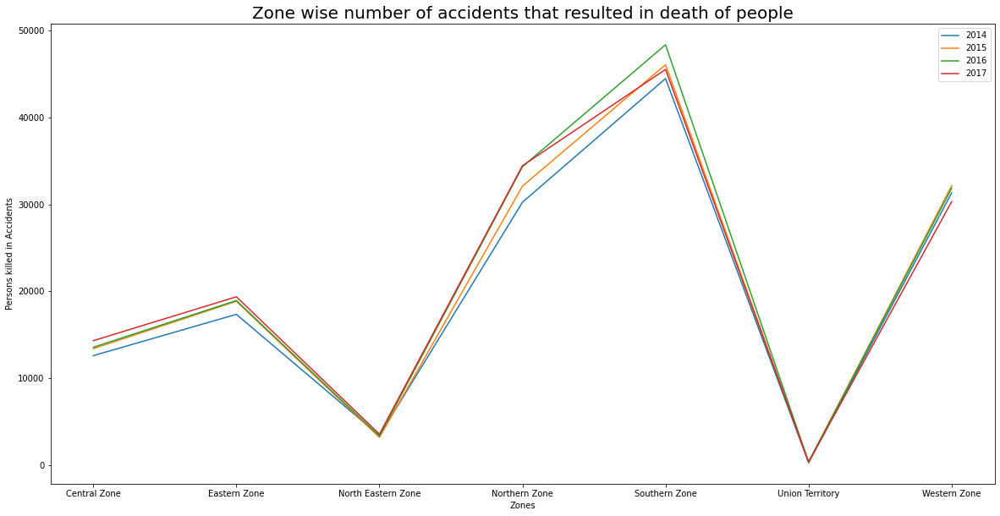

In [33]:
columns = [2014, 2015, 2016, 2017]
figure, ax = plt.subplots(1, 1, figsize=(20,10))
for index, column in enumerate(columns):
    sns.lineplot(x=total_zone_count['Zones'], y=total_zone_count[column], label=columns[index])
    plt.ylabel('Persons killed in Accidents')
    plt.title('Zone wise number of accidents that resulted in death of people', fontsize=20)

<h1>Zone wise number of accidents that resulted in injury</h1>

In [34]:
# Clubbing total injury count of people zone wise of each year
total_zone_count_injury = pd.pivot_table(people_injured_dataset, index=['Zones'], values=[2014, 2015, 2016, 2017], aggfunc=np.sum).reset_index()

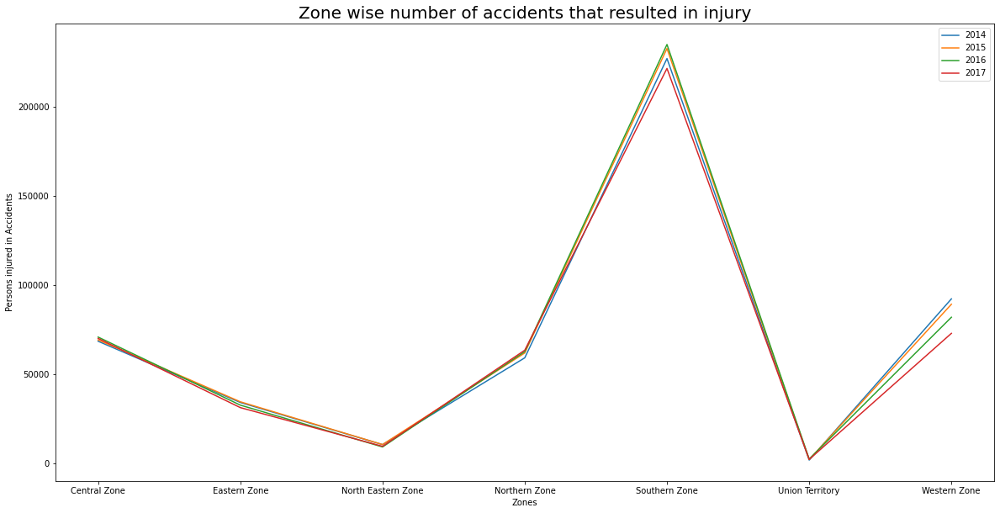

In [35]:
figure, ax = plt.subplots(1, 1, figsize=(20,10))
for index, column in enumerate(columns):
    sns.lineplot(x=total_zone_count_injury['Zones'], y=total_zone_count_injury[column], label=columns[index])
    plt.ylabel('Persons injured in Accidents')
    plt.title('Zone wise number of accidents that resulted in injury', fontsize=20)

<h1>Zone wise classification of States or Union Territories with Maximum number of death and injury </h1>

<h3>Northern Zone: No. of Accidents which resulted in death</h3>

In [36]:
table_of_northern_zone = people_killed_dataset[people_killed_dataset['Zones'] == 'Northern Zone']

In [37]:
# Organizing the sub table of the northern zone 
north_zone_killed = pd.pivot_table(
    table_of_northern_zone, 
    index=table_of_northern_zone['States/UTs'],
    values=[2014, 2015, 2016, 2017],
    aggfunc=np.sum
).reset_index()

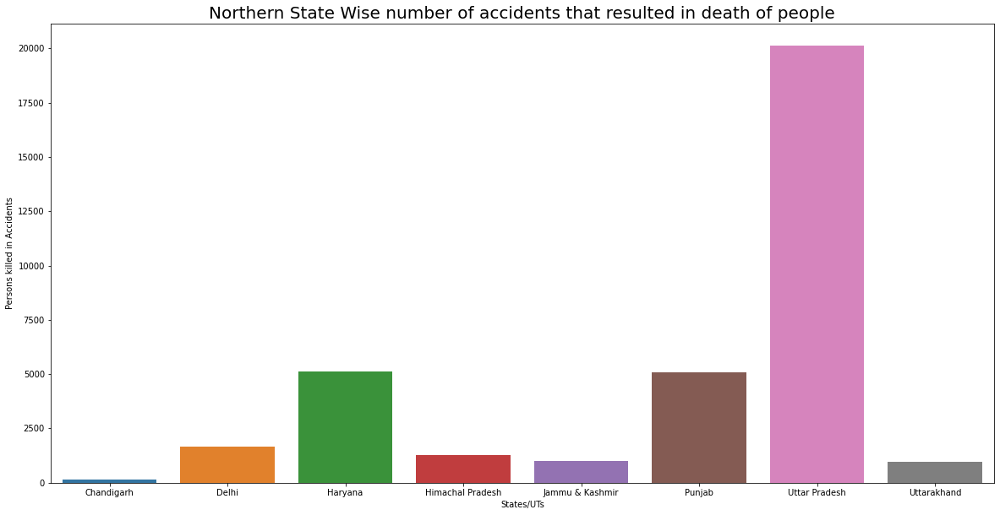

In [38]:
figure, ax = plt.subplots(1, 1, figsize=(20,10))
for index, column in enumerate(columns):
    sns.barplot(x=north_zone_killed['States/UTs'], y=north_zone_killed[column])
    plt.ylabel('Persons killed in Accidents')
    plt.title('Northern State Wise number of accidents that resulted in death of people', fontsize=20)

<h3>Northern Zone: No. of Accidents which resulted in injury</h3>

In [39]:
table_of_northern_zone_injured = people_injured_dataset[people_injured_dataset['Zones'] == 'Northern Zone']

In [40]:
# Organizing the sub table of the northern zone 
north_zone_injured = pd.pivot_table(
    table_of_northern_zone_injured, 
    index=table_of_northern_zone_injured['States/UTs'],
    values=[2014, 2015, 2016, 2017],
    aggfunc=np.sum
).reset_index()

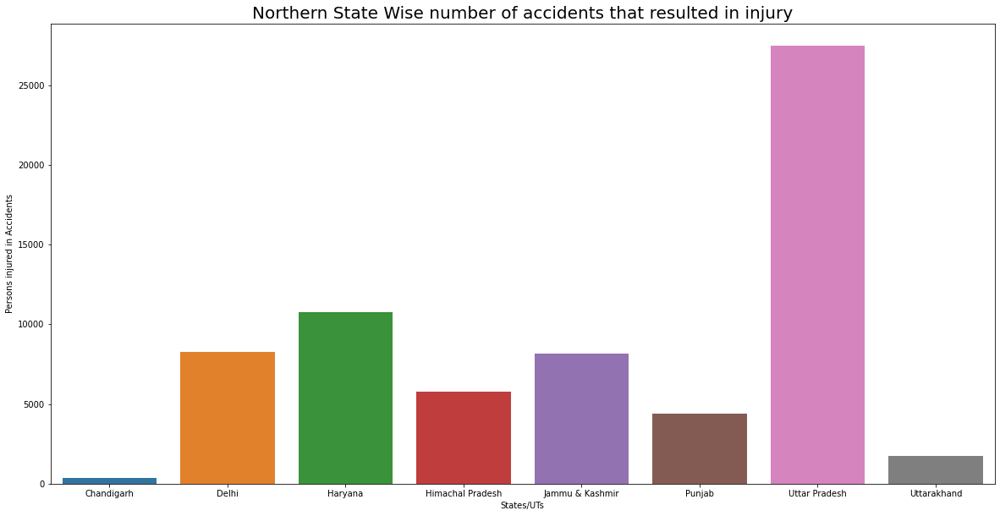

In [41]:
figure, ax = plt.subplots(1, 1, figsize=(20,10))
for index, column in enumerate(columns):
    sns.barplot(x=north_zone_injured['States/UTs'], y=north_zone_injured[column])
    plt.ylabel('Persons injured in Accidents')
    plt.title('Northern State Wise number of accidents that resulted in injury', fontsize=20)

<h3>Southern Zone: No. of Accidents that resulted in death</h3>

In [42]:
table_of_southern_zone = people_killed_dataset[people_killed_dataset['Zones'] == 'Southern Zone']

In [43]:
# Organizing the sub table of the northern zone 
south_zone_killed = pd.pivot_table(
    table_of_southern_zone, 
    index=table_of_southern_zone['States/UTs'],
    values=[2014, 2015, 2016, 2017],
    aggfunc=np.sum
).reset_index()

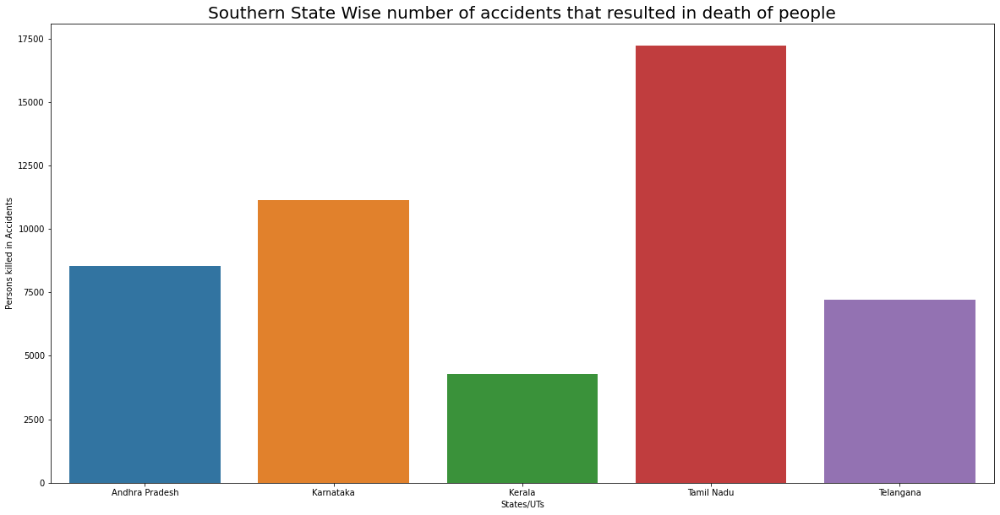

In [44]:
figure, ax = plt.subplots(1, 1, figsize=(20,10))
for index, column in enumerate(columns):
    sns.barplot(x=south_zone_killed['States/UTs'], y=south_zone_killed[column])
    plt.ylabel('Persons killed in Accidents')
    plt.title('Southern State Wise number of accidents that resulted in death of people', fontsize=20)

<h3>Southern Zone: No. of Accidents that resulted in injury</h3>

In [45]:
table_of_southern_zone_injured = people_injured_dataset[people_injured_dataset['Zones'] == 'Southern Zone']

In [46]:
south_zone_injured = pd.pivot_table(
    table_of_southern_zone_injured, 
    index=table_of_southern_zone_injured['States/UTs'],
    values=[2014, 2015, 2016, 2017],
    aggfunc=np.sum
).reset_index()

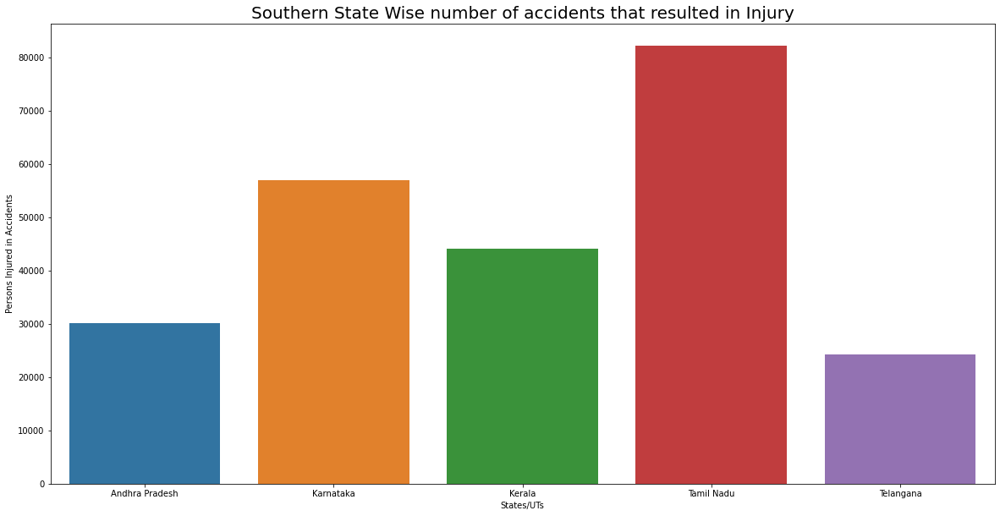

In [47]:
figure, ax = plt.subplots(1, 1, figsize=(20,10))
for index, column in enumerate(columns):
    sns.barplot(x=south_zone_injured['States/UTs'], y=south_zone_injured[column])
    plt.ylabel('Persons Injured in Accidents')
    plt.title('Southern State Wise number of accidents that resulted in Injury', fontsize=20)

<h1>Based on Weather Conditions</h1>

<h3>No. of accidents that resulted in death(Northern Zone)</h3>

In [48]:
sub_table = weather_dataset_killed[weather_dataset_killed['Zones'] == 'Northern Zone']

In [49]:
north_data = pd.pivot_table(sub_table, index=['Zones'], aggfunc=np.sum).reset_index()

In [50]:
north_data = north_data.T.reset_index()

In [51]:
north_data = north_data.rename(columns={
    'index': 'Weather Conditions',
    0: 'Total'
})

In [52]:
# drops the index at 0 which is the defined zone
north_data = north_data.drop(north_data.index[0])

In [53]:
north_data = north_data.sort_values(by=['Total'], ascending=False)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20]),
 <a list of 21 Text major ticklabel objects>)

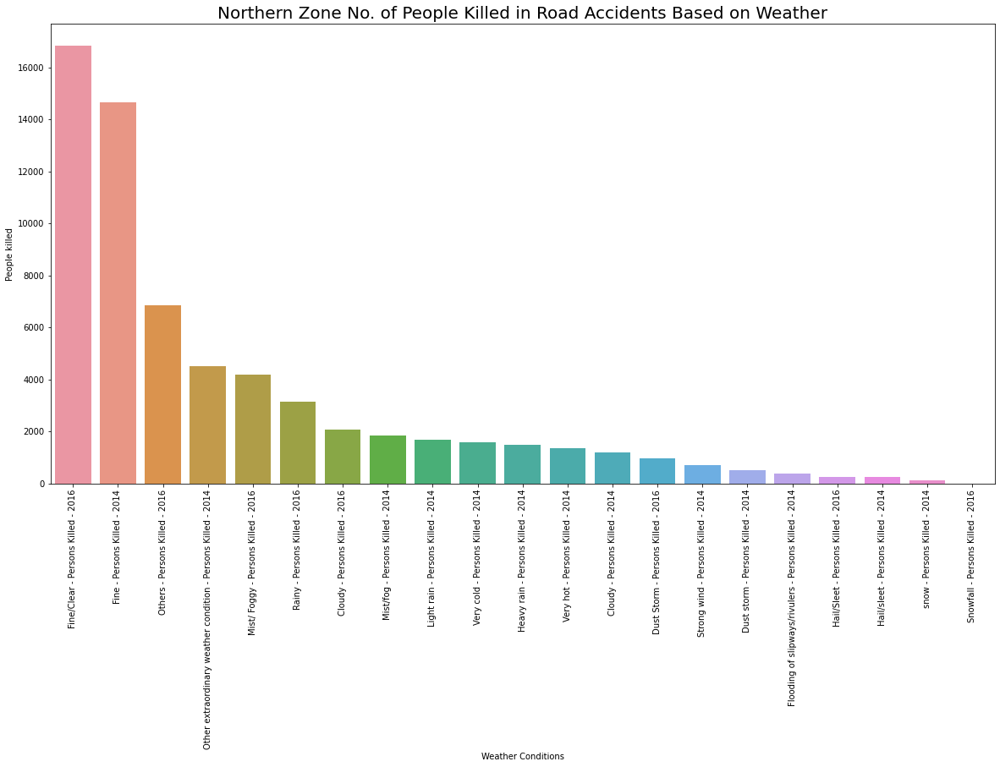

In [54]:
figure, ax = plt.subplots(1, 1, figsize=(20,10))
sns.barplot(x=north_data['Weather Conditions'], y=north_data['Total'])
plt.ylabel('People killed')
plt.title('Northern Zone No. of People Killed in Road Accidents Based on Weather', fontsize=20)
plt.xticks(rotation=90)

<h3>State Wise</h3>

In [55]:
state_north_killed = pd.pivot_table(sub_table, index=['State/ UT'], aggfunc=np.sum).reset_index()

In [56]:
features = list(state_north_killed.columns[2:])

In [57]:
state_north_killed = state_north_killed.sort_values(by=features, ascending=False)

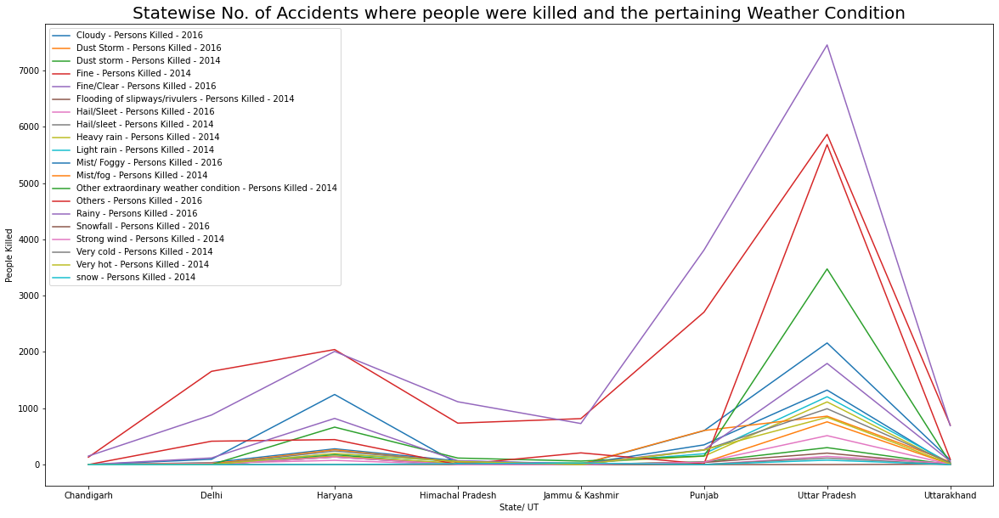

In [58]:
figure, ax = plt.subplots(1, 1, figsize=(20,10))
for index, weather in enumerate(features):
    sns.lineplot(x=state_north_killed['State/ UT'], y=state_north_killed[weather], label=features[index])
    plt.ylabel('People Killed')
    plt.title('Statewise No. of Accidents where people were killed and the pertaining Weather Condition', fontsize=20)

<h3>No. of accidents that resulted in injury(Northern Zone)</h3>

In [59]:
sub_table = weather_dataset_injured[weather_dataset_injured['Zones'] == 'Northern Zone']

In [60]:
north_data_injured = pd.pivot_table(sub_table, index=['Zones'], aggfunc=np.sum).reset_index()

In [61]:
north_data_injured = north_data_injured.T.reset_index()

In [62]:
north_data_injured = north_data_injured.rename(columns={
    'index': 'Weather Conditions',
    0: 'Total'
})

In [63]:
# drops the index at 0 which is the defined zone
north_data_injured = north_data_injured.drop(north_data_injured.index[0])

In [64]:
north_data_injured = north_data_injured.sort_values(by=['Total'], ascending=False)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20]),
 <a list of 21 Text major ticklabel objects>)

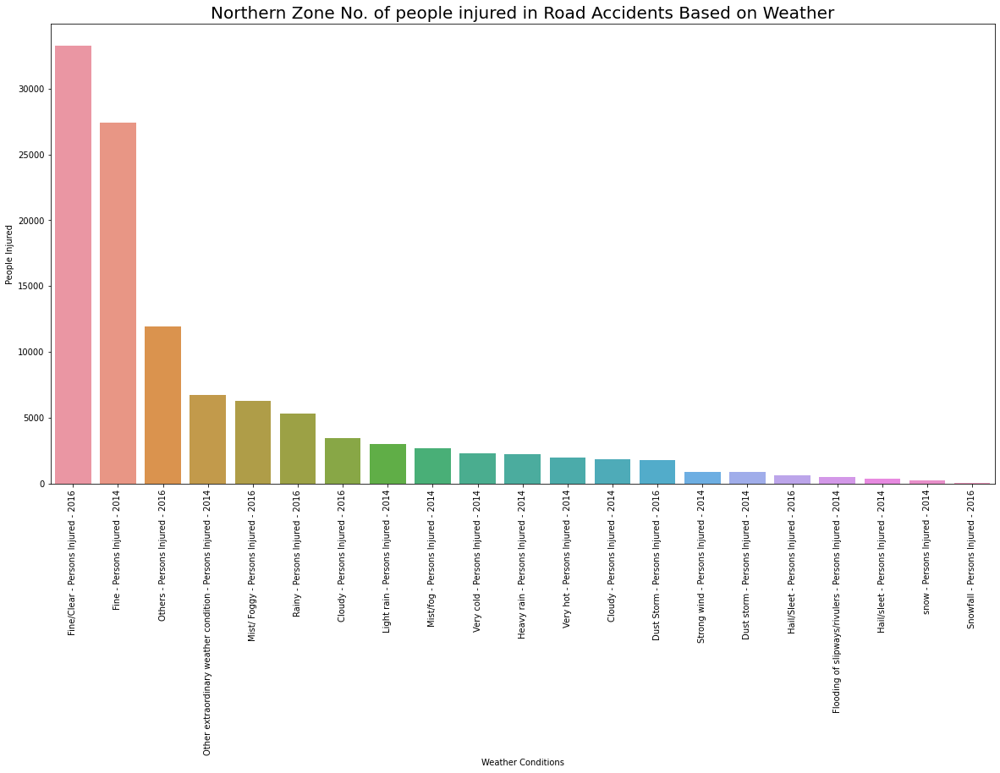

In [65]:
figure, ax = plt.subplots(1, 1, figsize=(20,10))
sns.barplot(x=north_data_injured['Weather Conditions'], y=north_data_injured['Total'])
plt.ylabel('People Injured')
plt.title('Northern Zone No. of people injured in Road Accidents Based on Weather', fontsize=20)
plt.xticks(rotation=90)

<h3>State Wise</h3>

In [66]:
state_north_injured = pd.pivot_table(sub_table, index=['State/ UT'], aggfunc=np.sum).reset_index()

In [67]:
features = list(state_north_injured.columns[2:])

In [68]:
state_north_injured = state_north_injured.sort_values(by=features, ascending=False)

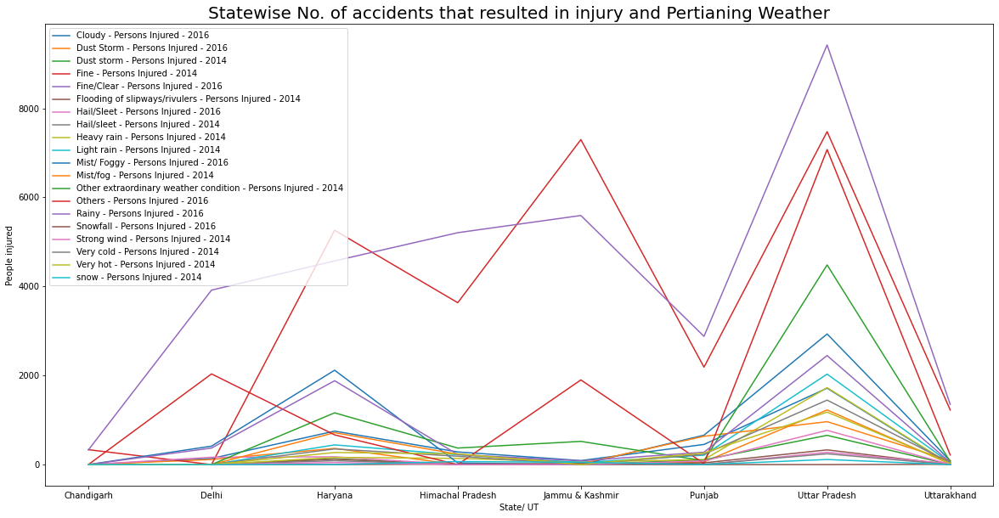

In [69]:
figure, ax = plt.subplots(1, 1, figsize=(20, 10))
for index, weather in enumerate(features):
    sns.lineplot(x=state_north_injured['State/ UT'], y=state_north_injured[weather], label=features[index])
    plt.ylabel('People injured')
    plt.title('Statewise No. of accidents that resulted in injury and Pertianing Weather', fontsize=20)

<h3>No. of accidents that resulted in death(Southern Zone)</h3>

In [70]:
sub_table = weather_dataset_killed[weather_dataset_killed['Zones'] == 'Southern Zone']

In [71]:
south_data = pd.pivot_table(sub_table, index=['Zones'], aggfunc=np.sum).reset_index()

In [72]:
south_data = south_data.T.reset_index()

In [73]:
south_data = south_data.rename(columns={
    'index': 'Weather Conditions',
    0: 'Total'
})

In [74]:
# drops the 1st row or the zone name
south_data = south_data.drop(south_data.index[0])

In [75]:
south_data = south_data.sort_values(by=['Total'], ascending=False)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20]),
 <a list of 21 Text major ticklabel objects>)

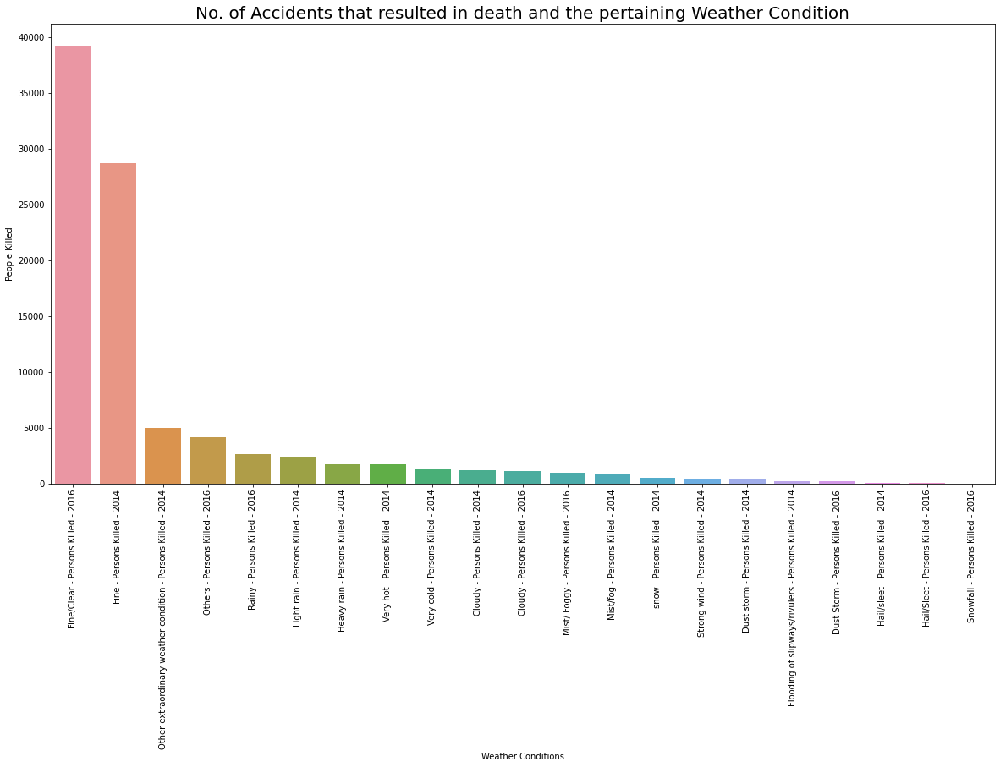

In [76]:
figure, ax = plt.subplots(1, 1, figsize=(20,10))
sns.barplot(x=south_data['Weather Conditions'], y=south_data['Total'])
plt.ylabel('People Killed')
plt.title('No. of Accidents that resulted in death and the pertaining Weather Condition', fontsize=20)
plt.xticks(rotation=90)

<h3>State Wise</h3>

In [77]:
state_south_killed = pd.pivot_table(sub_table, index=['State/ UT'], aggfunc=np.sum).reset_index()

In [78]:
features = list(state_south_killed.columns[2:])

In [79]:
state_south_killed = state_south_killed.sort_values(by=features, ascending=False)

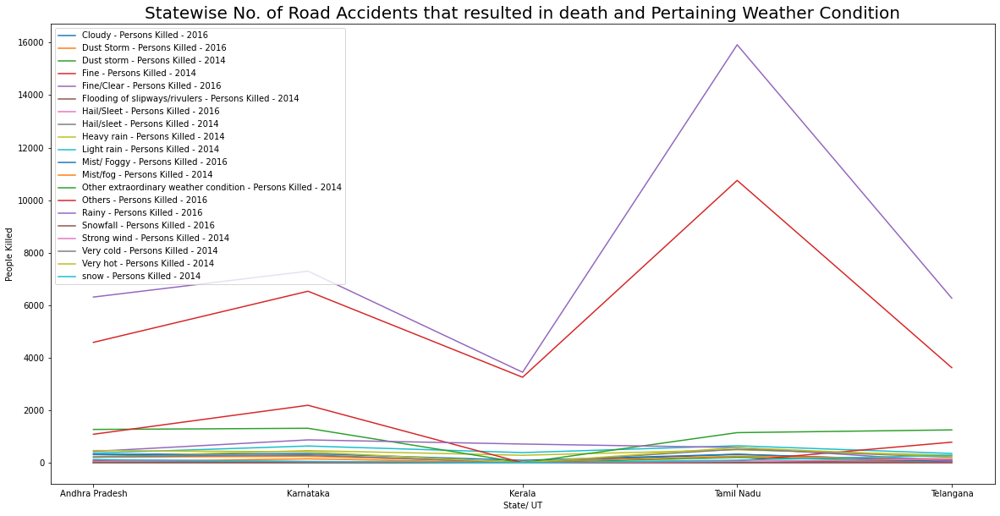

In [80]:
figure, ax = plt.subplots(1, 1, figsize=(20, 10))
for index, weather in enumerate(features):
    sns.lineplot(x=state_south_killed['State/ UT'], y=state_south_killed[weather], label=features[index])
    plt.ylabel('People Killed')
    plt.title('Statewise No. of Road Accidents that resulted in death and Pertaining Weather Condition', fontsize=20)

<h3>No. of accidents that resulted in injury(Southern Zone)</h3>

In [81]:
sub_table = weather_dataset_injured[weather_dataset_injured['Zones'] == 'Southern Zone']

In [82]:
south_data_injured = pd.pivot_table(sub_table, index=['Zones'], aggfunc=np.sum).reset_index()

In [83]:
south_data_injured = south_data_injured.T.reset_index()

In [84]:
south_data_injured = south_data_injured.rename(columns={
    'index': 'Weather Conditions',
    0: 'Total'
})

In [85]:
south_data_injured = south_data_injured.drop(south_data_injured.index[0])

In [86]:
south_data_injured = south_data_injured.sort_values(by=['Total'], ascending=False)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20]),
 <a list of 21 Text major ticklabel objects>)

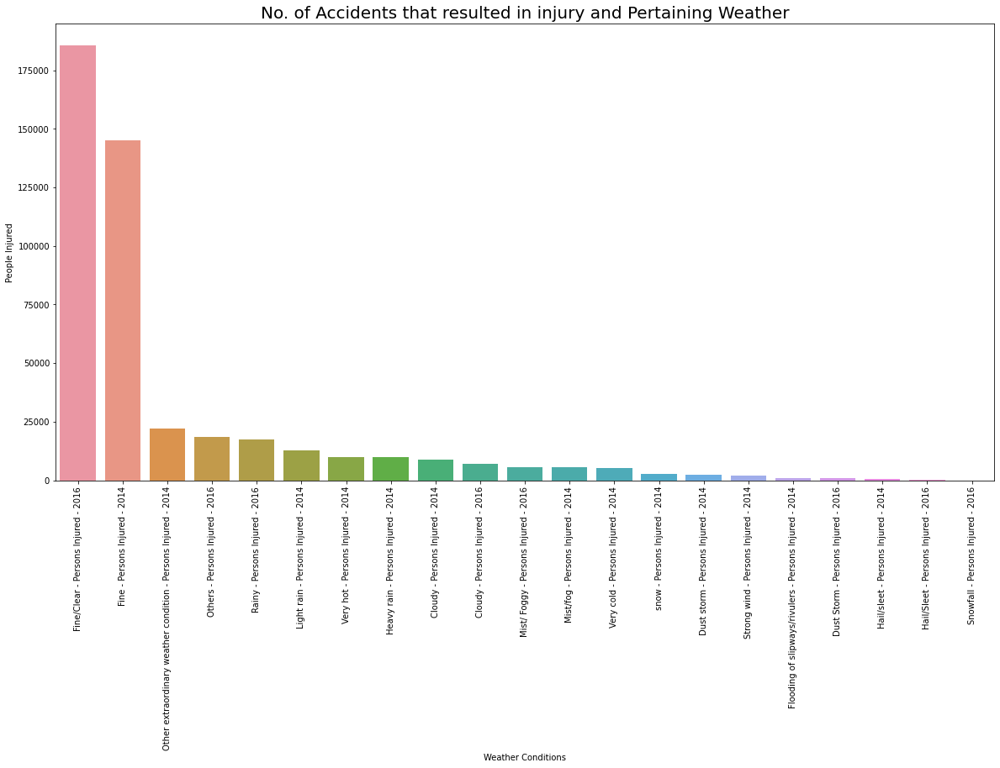

In [87]:
figure, ax = plt.subplots(1, 1, figsize=(20, 10))
sns.barplot(x=south_data_injured['Weather Conditions'], y=south_data_injured['Total'])
plt.ylabel('People Injured')
plt.title('No. of Accidents that resulted in injury and Pertaining Weather', fontsize=20)
plt.xticks(rotation=90)

<h3>State Wise</h3>

In [88]:
state_south_injured = pd.pivot_table(sub_table, index=['State/ UT'], aggfunc=np.sum).reset_index()

In [89]:
features = list(state_south_injured.columns[2:])

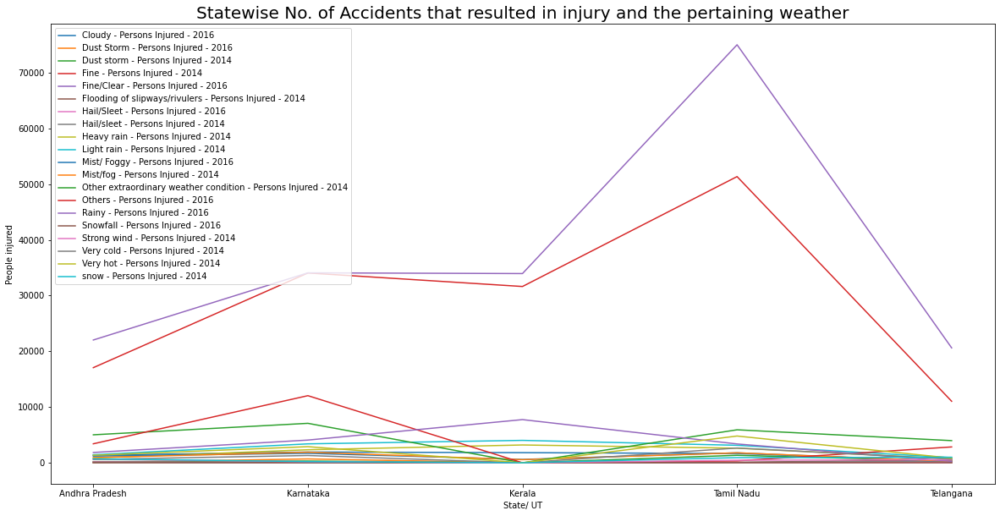

In [90]:
figure, ax = plt.subplots(1, 1, figsize=(20,10))
for index, weather in enumerate(features):
    sns.lineplot(x=state_south_injured['State/ UT'], y=state_south_injured[weather], label=features[index])
    plt.ylabel('People injured')
    plt.title('Statewise No. of Accidents that resulted in injury and the pertaining weather', fontsize=20)
    plt.legend(loc='upper left')

<h1>Based on Road Conditions</h1>

<h3>No. of accidents that resulted in death(Northern Zone)</h3>

In [91]:
sub_table = roadcon_dataset_killed[roadcon_dataset_killed['Zones'] == 'Northern Zone']

In [92]:
north_zone_road = pd.pivot_table(sub_table, index=['Zones'], aggfunc=np.sum).reset_index()

In [93]:
north_zone_road = north_zone_road.T.reset_index()

In [94]:
north_zone_road = north_zone_road.rename(columns={
    'index': 'Road Conditions',
    0: 'Total'
})

In [95]:
north_zone_road = north_zone_road.drop(north_zone_road.index[0])

In [96]:
north_zone_road = north_zone_road.sort_values(by=['Total'], ascending=False)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]),
 <a list of 64 Text major ticklabel objects>)

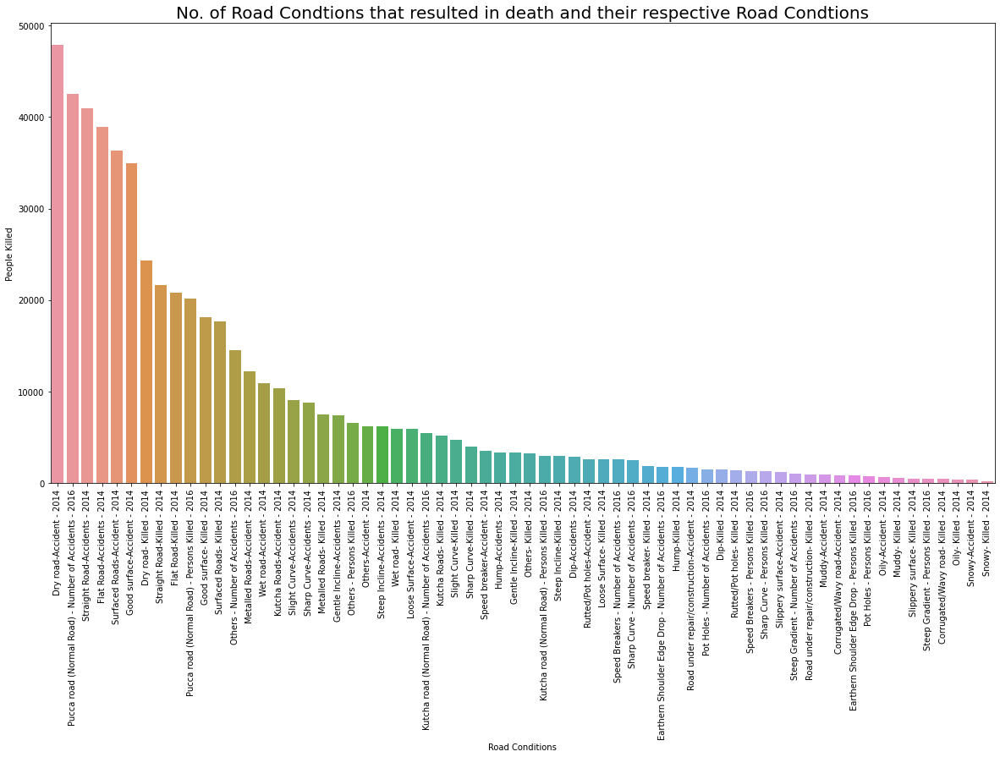

In [97]:
figure, ax = plt.subplots(1, 1, figsize=(20,10))
sns.barplot(x=north_zone_road['Road Conditions'], y=north_zone_road['Total'])
plt.ylabel('People Killed')
plt.title('No. of Road Condtions that resulted in death and their respective Road Condtions', fontsize=20)
plt.xticks(rotation=90)

# Seasonal Distribution of Accidents over the years

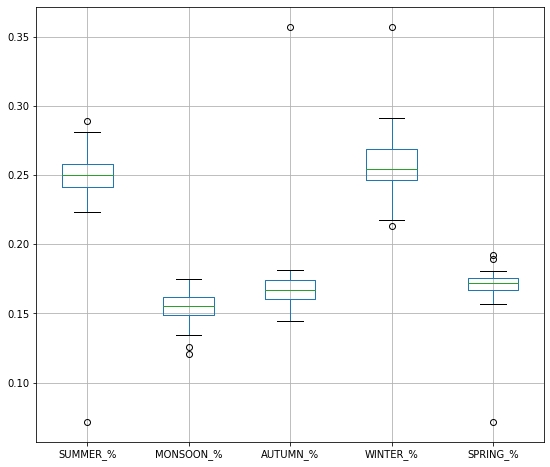

In [98]:
plt.figure(figsize=(20, 8))
ax = plt.subplot(1, 2, 1)
boxplot = state_month_grouped.boxplot(ax=ax, column=['SUMMER_%', 'MONSOON_%', 'AUTUMN_%', 'WINTER_%', 'SPRING_%'])

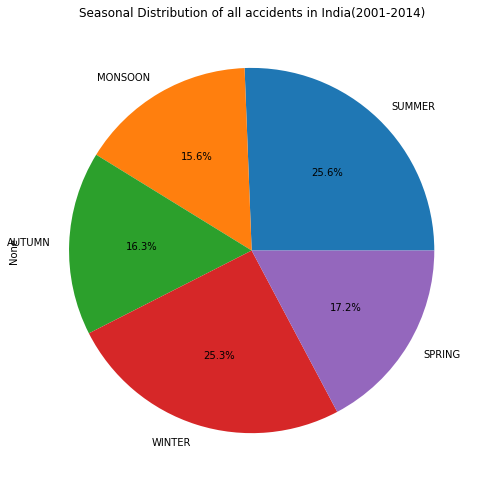

In [99]:
plt.figure(figsize=(18, 14))
ax=plt.subplot(1, 2, 1)
state_month_grouped.loc[:, 'SUMMER':'SPRING'].sum(axis=0).plot.pie(title='Seasonal Distribution of all accidents in India(2001-2014)', autopct='%1.1f%%')

# States with Highest Percentage of Accident in Each Season

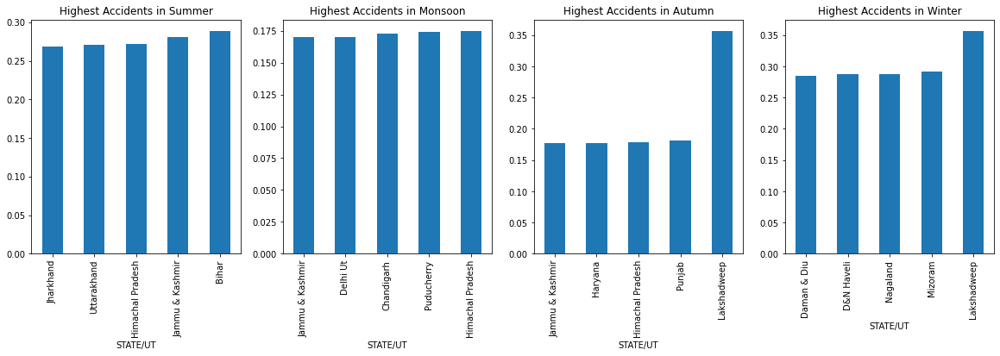

In [100]:
plt.figure(figsize=(20, 5))
plt.subplot(141)
summer_order = state_month_grouped.sort_values('SUMMER_%')
summer_order['SUMMER_%'].tail(5).plot.bar(title='Highest Accidents in Summer')
plt.subplot(142)
monsoon_order = state_month_grouped.sort_values('MONSOON_%')
monsoon_order['MONSOON_%'].tail(5).plot.bar(title='Highest Accidents in Monsoon')
plt.subplot(143)
autumn_order = state_month_grouped.sort_values('AUTUMN_%')
autumn_order['AUTUMN_%'].tail(5).plot.bar(title='Highest Accidents in Autumn')
plt.subplot(144)
winter_order = state_month_grouped.sort_values('WINTER_%')
winter_order['WINTER_%'].tail(5).plot.bar(title='Highest Accidents in Winter')

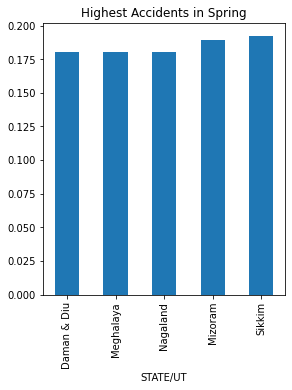

In [101]:
plt.figure(figsize=(20, 5))
plt.subplot(141)
spring_order = state_month_grouped.sort_values('SPRING_%')
spring_order['SPRING_%'].tail(5).plot.bar(title='Highest Accidents in Spring')

# Distribution of Accidents according to time of day

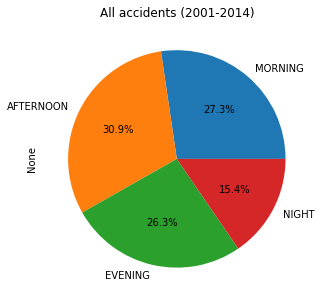

In [102]:
plt.figure(figsize=(5, 5))
state_hour_sum = state_hour_grouped.drop(columns=state_hour_grouped.columns[5:])
state_hour_sum = state_hour_sum.sum(axis=0)
state_hour_sum.drop(['Total']).T.plot.pie(title='All accidents (2001-2014)',autopct='%1.1f%%')

# Highest accident % in states according to Time of day

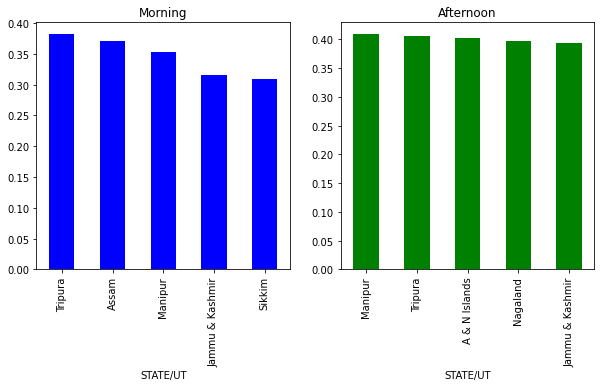

In [103]:
plt.figure(figsize=(10, 10))
state_hour_grouped.sort_values('MORNING_%', ascending=False).head().loc[:,'MORNING_%'].plot(kind='bar', title='Morning', ax=plt.subplot(221), color='b')
state_hour_grouped.sort_values('AFTERNOON_%', ascending=False).head().loc[:,'AFTERNOON_%'].plot(kind='bar', title='Afternoon', ax=plt.subplot(222), color='g')

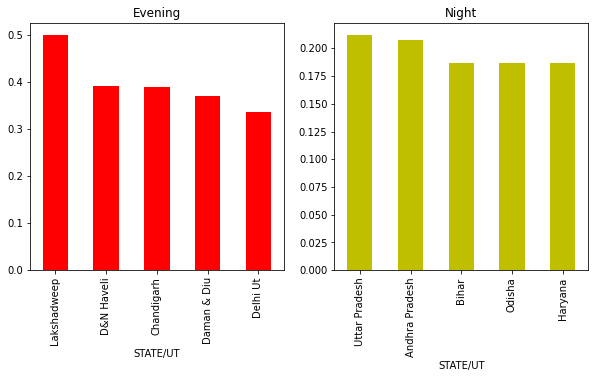

In [104]:
plt.figure(figsize=(10, 10))
state_hour_grouped.sort_values('EVENING_%', ascending=False).head().loc[:,'EVENING_%'].plot(kind='bar', title='Evening', ax=plt.subplot(221), color='r')
state_hour_grouped.sort_values('NIGHT_%', ascending=False).head().loc[:,'NIGHT_%'].plot(kind='bar', title='Night', ax=plt.subplot(222), color='y')

# Creating a new dataset for the purpose of model

In [105]:
drop_columns_accident = [col for col in roadcon_accident_dataset.columns if 'Accident' not in col]
drop_columns_accident.pop(0)

'State/ UT'

In [106]:
road_conn_only_accidents = roadcon_accident_dataset.drop(columns=drop_columns_accident)

In [107]:
dividing_years = [col for col in road_conn_only_accidents.columns if '2016' in col]

In [108]:
road_conn_only_accidents_2014 = road_conn_only_accidents.drop(columns=dividing_years)

In [109]:
road_conn_only_accidents_2014['Year'] = 2014

In [110]:
columns = {
    'Seasons': [], 
    'Time Of Day': [], 
    'Weather': [], 
    'Material Characteristic of Road': [],
    'Road Conditions': [],
    'Quality of Road': [],
    'Maneuverability': [],
    'Inclination': []
}

In [111]:
proper_dataset = pd.DataFrame(columns)

In [112]:
all_Seasons = ['SUMMER', 'MONSOON', 'AUTUMN', 'WINTER', 'SPRING']
all_Time_of_days = ['MORNING', 'AFTERNOON', 'EVENING', 'NIGHT']

In [113]:
weather_columns = [col for col in weather_accident_dataset.columns if 'Acc' in col]

In [114]:
weather_columns = [col for col in weather_columns if '2014' in col]

In [115]:
weather_columns = [col.split('-')[0].strip() for col in weather_columns]

In [116]:
all_weather_columns = weather_columns

In [117]:
all_material = [col.split('-')[0] for col in road_conn_only_accidents_2014.columns[1:4]]

In [118]:
all_road_conn = [col.split('-')[0] for col in road_conn_only_accidents_2014.columns[4:6]]

In [119]:
all_quality_road = [col.split('-')[0] for col in road_conn_only_accidents_2014.columns[6:17]]

In [120]:
all_maneuver = [col.split('-')[0] for col in road_conn_only_accidents_2014.columns[17:20]]

In [121]:
all_inclination = [col.split('-')[0] for col in road_conn_only_accidents_2014.columns[20:-1]]

In [122]:
all_numbers = [
    len(all_Time_of_days),
    len(all_weather_columns), 
    len(all_material), 
    len(all_road_conn),
    len(all_quality_road),
    len(all_maneuver),
    len(all_inclination)
]

In [123]:
def multiply(numbers):
    out = 1
    for i in numbers:
        out *= i
    return out

In [124]:
summer_columns = ['SUMMER'] * multiply(all_numbers)
monsoon_columns = ['MONSOON'] * multiply(all_numbers)
autumn_columns = ['AUTUMN'] * multiply(all_numbers)
winter_columns = ['WINTER'] * multiply(all_numbers)
spring_columns = ['SPRING'] * multiply(all_numbers)

In [125]:
morning_columns = ['MORNING'] * multiply(all_numbers[1:])
afternoon_columns = ['AFTERNOON'] * multiply(all_numbers[1:])
evening_columns = ['EVENING'] * multiply(all_numbers[1:])
night_columns = ['NIGHT'] * multiply(all_numbers[1:])

In [126]:
weather_columns = {}
for i in all_weather_columns:
    weather_columns[i] = [i] * multiply(all_numbers[2:])

In [127]:
material_columns = {}
for i in all_material:
    material_columns[i] = [i] * multiply(all_numbers[3:])

In [128]:
road_conn_columns = {}
for i in all_road_conn:
    road_conn_columns[i] = [i] * multiply(all_numbers[4:])

In [129]:
quality_columns = {}
for i in all_quality_road:
    quality_columns[i] = [i] * multiply(all_numbers[5:])

In [130]:
manueverable_columns = {}
for i in all_maneuver:
    manueverable_columns[i] = [i] * multiply(all_numbers[6:])

In [131]:
inclination_columns = {}
for i in all_inclination:
    inclination_columns[i] = [i] * multiply(all_numbers[7:])

In [132]:
only_summer_data = pd.DataFrame()
only_summer_data['Seasons'] = summer_columns
only_summer_data['Time Of Day'] = morning_columns + afternoon_columns + evening_columns + night_columns
only_summer_data['Weather'] = [item for sublist in list(weather_columns.values()) for item in sublist] * 4
only_summer_data['Material Characteristic of Road'] =  [item for sublist in list(material_columns.values()) for item in sublist] * multiply(all_numbers[:2])
only_summer_data['Road Conditions'] = [item for sublist in list(road_conn_columns.values()) for item in sublist] * multiply(all_numbers[:3])
only_summer_data['Quality of Road'] = [item for sublist in list(quality_columns.values()) for item in sublist] * multiply(all_numbers[:4])
only_summer_data['Maneuverability'] = [item for sublist in list(manueverable_columns.values()) for item in sublist] * multiply(all_numbers[:5])
only_summer_data['Inclinations'] = [item for sublist in list(inclination_columns.values()) for item in sublist] * multiply(all_numbers[:6])

only_monsoon_data = pd.DataFrame()
only_monsoon_data['Seasons'] = monsoon_columns
only_monsoon_data['Time Of Day'] = morning_columns + afternoon_columns + evening_columns + night_columns
only_monsoon_data['Weather'] = [item for sublist in list(weather_columns.values()) for item in sublist] * 4
only_monsoon_data['Material Characteristic of Road'] =  [item for sublist in list(material_columns.values()) for item in sublist] * multiply(all_numbers[:2])
only_monsoon_data['Road Conditions'] = [item for sublist in list(road_conn_columns.values()) for item in sublist] * multiply(all_numbers[:3])
only_monsoon_data['Quality of Road'] = [item for sublist in list(quality_columns.values()) for item in sublist] * multiply(all_numbers[:4])
only_monsoon_data['Maneuverability'] = [item for sublist in list(manueverable_columns.values()) for item in sublist] * multiply(all_numbers[:5])
only_monsoon_data['Inclinations'] = [item for sublist in list(inclination_columns.values()) for item in sublist] * multiply(all_numbers[:6])

only_autumn_data = pd.DataFrame()
only_autumn_data['Seasons'] = autumn_columns
only_autumn_data['Time Of Day'] = morning_columns + afternoon_columns + evening_columns + night_columns
only_autumn_data['Weather'] = [item for sublist in list(weather_columns.values()) for item in sublist] * 4
only_autumn_data['Material Characteristic of Road'] =  [item for sublist in list(material_columns.values()) for item in sublist] * multiply(all_numbers[:2])
only_autumn_data['Road Conditions'] = [item for sublist in list(road_conn_columns.values()) for item in sublist] * multiply(all_numbers[:3])
only_autumn_data['Quality of Road'] = [item for sublist in list(quality_columns.values()) for item in sublist] * multiply(all_numbers[:4])
only_autumn_data['Maneuverability'] = [item for sublist in list(manueverable_columns.values()) for item in sublist] * multiply(all_numbers[:5])
only_autumn_data['Inclinations'] = [item for sublist in list(inclination_columns.values()) for item in sublist] * multiply(all_numbers[:6])

only_winter_data = pd.DataFrame()
only_winter_data['Seasons'] = winter_columns
only_winter_data['Time Of Day'] = morning_columns + afternoon_columns + evening_columns + night_columns
only_winter_data['Weather'] = [item for sublist in list(weather_columns.values()) for item in sublist] * 4
only_winter_data['Material Characteristic of Road'] =  [item for sublist in list(material_columns.values()) for item in sublist] * multiply(all_numbers[:2])
only_winter_data['Road Conditions'] = [item for sublist in list(road_conn_columns.values()) for item in sublist] * multiply(all_numbers[:3])
only_winter_data['Quality of Road'] = [item for sublist in list(quality_columns.values()) for item in sublist] * multiply(all_numbers[:4])
only_winter_data['Maneuverability'] = [item for sublist in list(manueverable_columns.values()) for item in sublist] * multiply(all_numbers[:5])
only_winter_data['Inclinations'] = [item for sublist in list(inclination_columns.values()) for item in sublist] * multiply(all_numbers[:6])

only_spring_data = pd.DataFrame()
only_spring_data['Seasons'] = spring_columns
only_spring_data['Time Of Day'] = morning_columns + afternoon_columns + evening_columns + night_columns
only_spring_data['Weather'] = [item for sublist in list(weather_columns.values()) for item in sublist] * 4
only_spring_data['Material Characteristic of Road'] =  [item for sublist in list(material_columns.values()) for item in sublist] * multiply(all_numbers[:2])
only_spring_data['Road Conditions'] = [item for sublist in list(road_conn_columns.values()) for item in sublist] * multiply(all_numbers[:3])
only_spring_data['Quality of Road'] = [item for sublist in list(quality_columns.values()) for item in sublist] * multiply(all_numbers[:4])
only_spring_data['Maneuverability'] = [item for sublist in list(manueverable_columns.values()) for item in sublist] * multiply(all_numbers[:5])
only_spring_data['Inclinations'] = [item for sublist in list(inclination_columns.values()) for item in sublist] * multiply(all_numbers[:6])

In [149]:
proper_dataset = pd.concat([
    only_summer_data, 
    only_monsoon_data, 
    only_autumn_data, 
    only_winter_data, 
    only_spring_data], axis=0)

In [243]:
season_sum_values = dict(state_month_grouped.loc[:, 'SUMMER':'SPRING'].sum(axis=0))
#season_accident_priority = 
seasons = list(state_month_grouped.columns[1:6])

In [190]:
state_hour_grouped.loc[:, 'MORNING': 'NIGHT'].sum(axis=0)

MORNING      1531308
AFTERNOON    1730728
EVENING      1475747
NIGHT         865123
dtype: int64

In [162]:
drop_columns = [col for col in weather_accident_dataset.columns if 'Acc' not in col]
weather_only_accidents = weather_accident_dataset.drop(columns=drop_columns)

In [246]:
weather_only_accidents.iloc[:, :13].sum(axis=0)

In [250]:
road_conn_only_accidents_2014.iloc[:, 1:4].sum(axis=0)

Surfaced Roads-Accident - 2014    342149.0
Metalled Roads-Accident - 2014     84851.0
Kutcha Roads-Accident - 2014       53777.0
dtype: float64

In [251]:
road_conn_only_accidents_2014.iloc[:, 4:6].sum(axis=0)


Dry road-Accident - 2014    404654.0
Wet road-Accident - 2014     76123.0
dtype: float64

In [252]:
road_conn_only_accidents_2014.iloc[:, 6:17].sum(axis=0)

Good surface-Accident - 2014                      330802.0
Loose Surface-Accident - 2014                      28947.0
Rutted/Pot holes-Accident - 2014                   11106.0
Road under repair/construction-Accident - 2014     12177.0
Corrugated/Wavy road-Accident - 2014                4512.0
Slippery surface-Accident - 2014                    6113.0
Snowy-Accident - 2014                               1116.0
Muddy-Accident - 2014                               4027.0
Oily-Accident - 2014                                1767.0
Speed breaker-Accident - 2014                      11008.0
Others-Accident - 2014                             69202.0
dtype: float64

In [253]:
road_conn_only_accidents_2014.iloc[:, 17:20].sum(axis=0)

Straight Road-Accidents - 2014    370405.0
Slight Curve-Accidents - 2014      72283.0
Sharp Curve-Accidents - 2014       38089.0
dtype: float64

In [256]:
road_conn_only_accidents_2014.iloc[:, 20:-1].sum(axis=0)

Flat Road-Accidents - 2014         387511.0
Gentle Incline-Accidents - 2014     48183.0
Steep Incline-Accidents - 2014      20519.0
Hump-Accidents - 2014               13449.0
Dip-Accidents - 2014                11115.0
dtype: float64

In [372]:
decision_class = {
    'HIGH': ['MORNING', 'AFTERNOON', 'EVENING', 'Fine', 'Other extraordinary weather condition', 'Surfaced Roads'
             'Dry road', 'Good surface', 'Straight Road', 'Flat Road'],
    'MEDIUM': ['NIGHT', 'Mist/fog', 'Cloudy',  'Heavy rain', 'Metalled Roads'
               'Loose Surface', 'Rutted/Pot holes', 'Wet road' ,'Road under repair/construction', 'Speed breaker', 'Others'
               'Sharp Curve', 'Steep Incline', 'Hump', 'Slight Curve','Gentle Incline'], 
    'LOW': ['snow', 'Strong wind', 'Corrugated/Wavy road-Accident', 'Slippery surface'
            'Muddy', 'Dip', 'Light rain', 'Very hot', 'Very cold'],
    'NEGLIGIBLE': ['Hail/sleet', 'Flooding of slipways/rivulers','Snowy', 'Oily', 'Dust storm', 'Kutcha Roads']
}

In [373]:
classes = ['HIGH', 'MEDIUM', 'LOW', 'NEGLIGIBLE']
proper_columns = list(columns.keys())
def get_majiority(output):
    max_value = classes[0]
    for i in range(1, len(classes)):
        if output.count(classes[i]) > output.count(max_value):
            max_value = classes[i]
    return max_value


def assign_values(row):
    output = []
    for i in row:
        for k, v in decision_class.items():
            if i in v:
                output.append(k)
    return get_majiority(output)



In [377]:
row = proper_dataset.iloc[59999, :]

#decision_column = list(map(assign_values, map(dict, proper_dataset.iloc[:,:])))
a = dict(row)
a.values()
assign_values(a.values())

['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'LOW']


'LOW'

In [378]:
all_rows = []
for i in range(len(proper_dataset)):
    all_rows.append(dict(proper_dataset.iloc[i, :]).values())
    
decision_column = list(map(assign_values, all_rows))

['HIGH', 'HIGH', 'HIGH', 'HIGH', 'HIGH']
['HIGH', 'HIGH', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'HIGH', 'LOW']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM', 'HIGH']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM', 'LOW']
['HIGH', 'HIGH', 'HIGH', 'HIGH']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'LOW']
['HIGH', 'HIGH', 'HIGH', 'HIGH']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'LOW']
['HIGH', 'HIGH', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM'

['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['H

['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDI

['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE',

['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDI

['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MED

['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HI

['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM

['HIGH', 'NEGLIGIBLE', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'LOW']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH', 'LOW']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'LOW']


['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM'

['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'LOW']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM'

['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HI

['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH'

['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM

['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIG

['HIGH', 'LOW', 'HIGH']
['HIGH', 'LOW', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM']
['HIGH', 'LOW', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 

['HIGH', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'LOW']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'LOW']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 

['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']


['MEDIUM', 'HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM', 'NEGLIGIBLE', 'LOW']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'HIGH']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'LOW']
['MEDIUM', 'HIGH', 'MEDIUM', 'HIGH', 'HIGH']
['MEDIUM', 'HIGH', 'MEDIUM', 'HIGH', 'MEDI

['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM', 'LOW']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'LOW']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'LOW']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'MEDIU

['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'LOW']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'LOW']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'M

['MEDIUM', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'HIGH']
['MEDIUM', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'LOW']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDI

['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'LOW']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['MEDIUM', 'NEGLIGIBLE', 'HIGH', 'HIGH', 'HIGH']
['MEDIUM', 'NEGLIGIBLE', 'HIGH', 'HIGH', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'HIGH', 'HIGH', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'HIGH', 'HIGH', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'HIGH', 'HIGH', 'LOW']
['MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM', 'HIGH']
['MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM', 'LOW']
['MEDIUM', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'HIGH', 'ME

['MEDIUM', 'LOW', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM']
['MEDIUM', 'LOW', 'LOW']
['MEDIUM', 'LOW', 'HIGH', 'HIGH']
['MEDIUM', 'LOW', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'HIGH', 'LOW']
['MEDIUM', 'LOW', 'MEDIUM', 'HIGH']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'LOW']
['MEDIUM', 'LOW', 'HIGH']
['MEDIUM', 'LOW', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM']
['MEDIUM', 'LOW', 'LOW']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'HIGH', 'LOW']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIG

['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'LOW']
['HIGH', 'HIGH', 'HIGH', 'HIGH']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'LOW']
['HIGH', 'HIGH', 'HI

['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', '

['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']


['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIB

['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'ME

['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'M

['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'LOW']
['HIGH', 'HIGH', 'HIGH', 'HIGH']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH',

['HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 

['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'HIGH', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'HIGH', 'HIGH', 'LOW']

['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'LOW']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'LOW']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIB

['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'HIGH', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'HIGH']
['HIGH', 'LOW', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM']
['HIGH', 'L

['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']


['HIGH', 'LOW', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'HIGH', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'HIGH']
['HIGH', 'LOW', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM']
['HIGH', 'LOW', 'LOW']
['HIGH', 'LOW', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'HIGH', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'HIGH']
['HIGH', 'LOW', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM']
['HIGH', 'LOW', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH',

['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'HIGH

['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'M

['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE

['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIG

['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', '

['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'NEGLIGIBLE', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NE

['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDI

['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['MEDIUM', 'MEDIUM', 'HIGH']
['MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'LOW']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'LOW']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'LOW']
['MEDIUM', 'MEDIUM', 

['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'LOW']
['MEDIUM', 'LOW', 'HIGH', 'HIGH', 'HIGH']
['MEDIUM', 'LOW', 'HIGH', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'HIGH', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'HIGH', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'HIGH', 'HIGH', 'LOW']
['MEDIUM', 'LOW', 'HIGH', 'MEDIUM', 'HIGH']
['MEDIUM', 'LOW', 'HIGH', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'HIGH', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'HIGH', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'HIGH', 'MEDIUM', 'LOW']
['MEDIUM', 'LOW', 'HIGH', 'HIGH']
['MEDIUM', 'LOW', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'HIGH', 'LOW']
['MEDIUM', 'LOW', 'HIGH', 'HIGH']
['MEDIUM', 'LOW', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'HIGH', 'LOW']
['MEDIUM', 'LOW', 'MEDIUM', 'HIGH']
['MEDIUM', 'LOW', 'MEDIUM

['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'LOW']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['MEDIUM', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'HIGH', 'LOW']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['MEDIUM', 'NEGLIGIBLE', 'HIGH']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDI

['MEDIUM', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'HIGH']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'LOW']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'LOW']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH']


['MEDIUM', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['MEDIUM', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['MEDIUM', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'LOW']
['MEDIUM', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH']
['MEDIUM', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'LOW']
['MEDIUM', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['MEDIUM', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'NEGLIGIBLE', 

['MEDIUM', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'LOW']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'LOW']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'LOW']
['MEDIUM', 'LOW', 'NEGLIGI

['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'LOW']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'HIGH']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'N

['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'HIGH', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH

['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'HIGH', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'HIGH', 'MEDI

['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'HIGH', 'LOW']
['HIGH', 'LOW', 'MEDIUM',

['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'LOW']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'LOW']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'H

['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 

['HIGH', 'HIGH', 'NEGLIGIBLE', 'HIGH', 'LOW']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'HIGH']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH']
['HIGH', 'HIGH', 'M

['HIGH', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'HIGH']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'LOW']
['HIGH', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'HIGH', 'MED

['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'ME

['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'LOW']


['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
[

['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['HI

['HIGH', 'HIGH', 'HIGH', 'MEDIUM', 'LOW']
['HIGH', 'HIGH', 'HIGH', 'HIGH']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'LOW']
['HIGH', 'HIGH', 'HIGH', 'HIGH']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'LOW']
['HIGH', 'HIGH', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIU

['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'HIGH', 'HIGH', 'HIGH']
['HIGH', 'MEDIUM', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'HIGH', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'HIGH', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'HIGH', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HI

['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH', 'HIGH']
['HIGH'

['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MED

['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'HIGH', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'HIGH', 'LOW']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGL

['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'HIGH', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'HIGH']
['HIGH', 'LOW', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM']
['HIGH', 'LOW', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'ME

['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'LOW']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM',

['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'LOW']
['MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['MEDIUM', 'MEDIUM', 'HIGH']
['MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'LOW']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'LOW']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDI

['MEDIUM', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM', 'LOW']
['MEDIUM', 'LOW', 'MEDIUM', 'HIGH', 'HIGH']
['MEDIUM', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'HIGH', 'LOW']
['MEDIUM', 'LOW', 'MEDIUM', 'HIGH', 'HIGH']
['MEDIUM', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'HIGH', 'LOW']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM', 'LOW']
['MEDIUM', 'LOW', 'MEDIUM', 'HIGH']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM']


['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['MEDIUM', 'NEGLIGIBLE', 'HIGH']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'LOW']
['MEDIUM', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'HIGH', 'LOW']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['MEDIUM', 'NEGLIGIBLE', 'HIGH']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'LOW']
['MEDIUM', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['MEDIUM', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'NEGLI

['MEDIUM', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'HIGH']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'LOW']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'LOW']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['

['MEDIUM', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'LOW']
['MEDIUM', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['MEDIUM', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'LOW']
['MEDIUM', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['MEDIUM', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['MEDIUM', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['MEDIUM', 'NEGLIGIBLE', 'NEGL

['MEDIUM', 'HIGH', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'HIGH', 'NEGLIGIBLE', 'LOW']
['MEDIUM', 'HIGH', 'HIGH', 'HIGH']
['MEDIUM', 'HIGH', 'HIGH', 'MEDIUM']
['MEDIUM', 'HIGH', 'HIGH', 'MEDIUM']
['MEDIUM', 'HIGH', 'HIGH', 'MEDIUM']
['MEDIUM', 'HIGH', 'HIGH', 'LOW']
['MEDIUM', 'HIGH', 'MEDIUM', 'HIGH']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM', 'LOW']
['MEDIUM', 'HIGH', 'HIGH']
['MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'HIGH', 'LOW']
['MEDIUM', 'HIGH', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['MEDIUM', 'HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'HIGH', 'NEGLIGIBLE', 'HIGH', 'LOW']
['MEDIUM', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['MEDIUM', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']


['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'HIGH']
['HIG

['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'HIGH', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'HIGH']
['HIGH', 'LOW', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM']
['HIGH', 'LOW', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'HIGH',

['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLI

['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH']
['

['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'M

['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'ME

['HIGH', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 

['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'M

['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'LOW']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'LOW']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
[

['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDI

['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['H

['HIGH', 'HIGH', 'HIGH', 'HIGH', 'LOW']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM', 'HIGH']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM', 'LOW']
['HIGH', 'HIGH', 'HIGH', 'HIGH']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'LOW']
['HIGH', 'HIGH', 'HIGH', 'HIGH']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'LOW']
['HIGH', 'HIGH', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['

['HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'HIGH',

['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM'

['HIGH', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'LOW']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']


['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW'

['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIG

['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH', 'HIGH', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH

['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'LOW']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'HIGH']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'LOW']
['MEDIUM', 'HIGH', 'MEDIUM', 'HIGH', 'HIGH']
[

['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDI

['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 

['MEDIUM', 'NEGLIGIBLE', 'HIGH']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'LOW']
['MEDIUM', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'HIGH', 'LOW']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['MEDIUM', 'NEGLIGIBLE', 'HIGH']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'LOW']
['MEDIUM', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['MEDIUM', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['ME

['MEDIUM', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'HIGH', 'LOW']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM', 'LOW']
['MEDIUM', 'LOW', 'MEDIUM', 'HIGH']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'LOW']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'HIGH', 'HIGH', 'HIGH']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'HIGH', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'HIGH', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'HIGH', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'HIGH', 'HIGH', 'LOW']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'HIGH', 'MEDIUM', 'HIGH']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'HIGH', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'HIGH', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBL

['MEDIUM', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'HIGH', 'LOW']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM', 'LOW']
['MEDIUM', 'LOW', 'MEDIUM', 'HIGH']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'LOW']
['MEDIUM', 'LOW', 'HIGH', 'HIGH']
['MEDIUM', 'LOW', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'HIGH', 'LOW']
['MEDIUM', 'LOW', 'MEDIUM', 'HIGH']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'LOW']
['MEDIUM', 'LOW', 'HIGH']
['MEDIUM', 'LOW', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM']
['M

['MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'HIGH', 'LOW']
['MEDIUM', 'HIGH', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['MEDIUM', 'HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'HIGH', 'NEGLIGIBLE', 'HIGH', 'LOW']
['MEDIUM', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['MEDIUM', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['MEDIUM', 'HIGH', 'NEGLIGIBLE', 'HIGH']
['MEDIUM', 'HIGH', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'HIGH', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'HIGH', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'HIGH', 'NEGLIGIBLE', 'LOW']
['MEDIUM', 'HIGH', 'HIGH', 'HIGH']
['MEDIUM', 'HIGH', 'HIGH', 'MEDIUM']
['MEDIUM', 'HIGH', 'HIGH', 'MEDIUM']
['MEDIUM', 'HIGH', 'HIGH', 'MEDIUM']
['MEDIUM', 'HIGH', 'H

['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIG

['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', '

['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'HIGH']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'LOW']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'NEG

['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGL

['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBL

['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW'

['HIGH', 'HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'HIGH', 'LOW']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'HIGH']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'LOW']
['HIGH', 'HIGH', 'HIGH', 'HIGH']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'LOW']
['HIGH'

['HIGH', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM'

['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'ME

['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM

['HIGH', 'NEGLIGIBLE', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'HIGH', 'LOW']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'LOW']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'HIGH', 'LOW']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'HIGH']
['HIGH', 'NEGL

['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'NEGLIGIB

['HIGH', 'HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM', 'LOW']
['HIGH', 'HIGH', 'HIGH', 'HIGH']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'LOW']
['HIGH', 'HIGH', 'HIGH', 'HIGH']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'HIGH', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'LOW']
['HIGH', 'HIGH', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'HIGH', 'MEDIUM', 'MEDIUM', 'HIGH'

['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['H

['HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'MEDIUM', 'MEDIUM

['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'NEGLIGIBL

['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
[

['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'HIGH', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'MEDIUM', 'HIGH']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'MEDIUM']
['HIGH', 'LOW', 'MEDIUM', 'LOW']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH', 'HIGH', 'HIGH']
['HIGH', 'LOW', 'NEGLIGIBLE', 'HIGH', 'HIGH', 'MEDIUM

['HIGH', 'HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM', 'LOW']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'HIGH', 'LOW']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'HIGH', 'LOW']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'HIGH']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'MEDIUM']
['HIGH', 'HIGH', 'NEGLIGIBLE', 'LOW']
['HIGH', 'HIGH

['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'LOW']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'LOW']


['MEDIUM', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['MEDIUM', 'MEDIUM', 'HIGH', 'HIGH', 'HIGH']
['MEDIUM', 'MEDIUM', 'HIGH', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'HIGH', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'HIGH', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'HIGH', 'HIGH', 'LOW']
['MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM', 'HIGH']
['MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM', 'LOW']
['MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['MEDIUM', 'MEDIUM', 'HIGH', 'HIGH']
['MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'MEDIUM', 

['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH', 'LOW']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'HIGH']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'HIGH']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM', 'LOW']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'HIGH']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH', 'LOW']
['MEDIUM', 'NEGLIGIBLE', 'M

['MEDIUM', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'HIGH', 'LOW']
['MEDIUM', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['MEDIUM', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['MEDIUM', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'HIGH']
['MEDIUM', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'NEGLIGIBLE', 'LOW']
['MEDIUM', 'LOW', 'MEDIUM', 'HIGH', 'HIGH']
['MEDIUM', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'MEDIUM', 'HIGH', 'LOW']
['MEDIUM', 'LOW', 'MEDIUM', 'MEDIUM', 

['MEDIUM', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'HIGH']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'LOW']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'HIGH']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH', 'LOW']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'HIGH']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'MEDIUM', 'LOW']
['MEDIUM', 'LOW', 'NEGLIGIBLE', 'NEGLIGIBLE', 'HIGH']


['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM', 'LOW']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'HIGH']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'LOW']
['MEDIUM', 'HIGH', 'MEDIUM', 'HIGH', 'HIGH']
['MEDIUM', 'HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM', 'HIGH', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM', 'HIGH', 'LOW']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'HIGH']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM', 'LOW']
['MEDIUM', 'HIGH', 'MEDIUM', 'HIGH']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM', 'MEDIUM']
['MEDIUM', 'HIGH', 'MEDIUM', 'LOW']
['MEDIUM', 'HIGH', 'NEGLIGIBLE', 'HIGH', 'HI

In [379]:
proper_dataset['Chance of Accident'] = decision_column

In [381]:
proper_dataset.to_csv('Final.csv')

In [387]:
from sklearn.preprocessing import LabelEncoder
encode = LabelEncoder()
proper_dataset['Seasons']= encode.fit_transform(proper_dataset['Seasons'])
proper_dataset['Time Of Day']= encode.fit_transform(proper_dataset['Time Of Day'])
proper_dataset['Weather']= encode.fit_transform(proper_dataset['Weather'])
proper_dataset['Material Characteristic of Road']= encode.fit_transform(proper_dataset['Material Characteristic of Road'])
proper_dataset['Road Conditions']= encode.fit_transform(proper_dataset['Road Conditions'])
proper_dataset['Quality of Road']= encode.fit_transform(proper_dataset['Quality of Road'])
proper_dataset['Maneuverability']= encode.fit_transform(proper_dataset['Maneuverability'])
proper_dataset['Inclinations']= encode.fit_transform(proper_dataset['Inclinations'])
proper_dataset['Chance of Accident']= encode.fit_transform(proper_dataset['Chance of Accident'])

In [390]:
proper_dataset.describe()

,Seasons,Time Of Day,Weather,Material Characteristic of Road,Road Conditions,Quality of Road,Maneuverability,Inclinations,Chance of Accident
count,257400.000000,257400.000000,257400.000000,257400.000000,257400.000000,257400.000000,257400.000000,257400.000000,257400.000000
mean,2.000000,1.500000,6.000000,1.000000,0.500000,5.000000,1.000000,2.000000,1.148951
std,1.414216,1.118036,3.741665,0.816498,0.500001,3.162284,0.816498,1.414216,1.013008
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.750000,3.000000,0.000000,0.000000,2.000000,0.000000,1.000000,0.000000
50%,2.000000,1.500000,6.000000,1.000000,0.500000,5.000000,1.000000,2.000000,2.000000
75%,3.000000,2.250000,9.000000,2.000000,1.000000,8.000000,2.000000,3.000000,2.000000
max,4.000000,3.000000,12.000000,2.000000,1.000000,10.000000,2.000000,4.000000,3.000000


In [401]:
from sklearn.tree import DecisionTreeClassifier, plot_tree

In [402]:
model = DecisionTreeClassifier()
x = np.array(proper_dataset.iloc[:, :8])

In [403]:
y = np.array(proper_dataset.iloc[:,8])

In [404]:
x

array([[3, 2, 2, ..., 1, 2, 1],
       [3, 2, 2, ..., 1, 2, 2],
       [3, 2, 2, ..., 1, 2, 4],
       ...,
       [2, 3, 8, ..., 5, 0, 4],
       [2, 3, 8, ..., 5, 0, 3],
       [2, 3, 8, ..., 5, 0, 0]])

In [405]:
y

array([0, 0, 0, ..., 2, 2, 2])

[Text(220.14913939000292, 212.004, 'X[6] <= 1.5\ngini = 0.542\nsamples = 257400\nvalue = [109430, 6525, 135120, 6325]'),
 Text(161.40764600409835, 201.132, 'X[7] <= 1.5\ngini = 0.496\nsamples = 171600\nvalue = [49250, 6000, 111090, 5260]'),
 Text(107.06910860655738, 190.26, 'X[1] <= 2.5\ngini = 0.607\nsamples = 68640\nvalue = [32330, 6000, 27615, 2695]'),
 Text(65.70034991583724, 179.388, 'X[7] <= 0.5\ngini = 0.573\nsamples = 51480\nvalue = [30150, 5400, 13770, 2160]'),
 Text(53.65476891832553, 168.516, 'X[2] <= 8.5\ngini = 0.687\nsamples = 25740\nvalue = [8010, 5400, 10530, 1800]'),
 Text(44.485533152810305, 157.644, 'X[2] <= 7.5\ngini = 0.634\nsamples = 17820\nvalue = [7290, 1080, 7650, 1800]'),
 Text(31.733595579625295, 146.772, 'X[6] <= 0.5\ngini = 0.639\nsamples = 15840\nvalue = [5445, 1080, 7515, 1800]'),
 Text(18.15623536299766, 135.9, 'X[2] <= 4.5\ngini = 0.671\nsamples = 7920\nvalue = [3645, 765, 2295, 1215]'),
 Text(10.290983606557377, 125.02799999999999, 'X[3] <= 0.5\ngini =

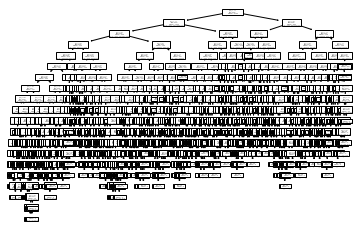

In [406]:
plot_tree(model.fit(x, y))

In [407]:
model.predict(x,[['AUTUMN', 'NIGHT', 'MONSOON', 'Surfaced Roads', 'Wet road', 'Rutted/Pot holes', 'Slight Curve', 'Dip']])

array([0, 0, 0, ..., 2, 2, 2])